## Processing and Color Analysis
<or>
    <li>Applying Gray-World Algorithm</li>
    <li>Appling Histogram Equalization</li>
    <li>Applying CLAHE</li>
    <li>Comparison</li>
<or/>


#### Applying Gray-World Algorithm
This algorithm performs a simple form of white balance correction (White balance correction is a process used in image processing and photography to ensure that the colors in an image appear natural) on an input image, It assumes that average pixel value is neutral gray (128) because of good distribution of colors. So we can estimate pixel color by looking at the average color. 

In [ ]:
import cv2
import numpy as np

def GW_white_balance(img):
    img_LAB = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    avg_a = np.average(img_LAB[:, :, 1])
    avg_b = np.average(img_LAB[:, :, 2])
    img_LAB[:, :, 1] = img_LAB[:, :, 1] - ((avg_a - 128) * (img_LAB[:, :, 0] / 255.0) * 5)
    img_LAB[:, :, 2] = img_LAB[:, :, 2] - ((avg_b - 128) * (img_LAB[:, :, 0] / 255.0) * 5)
    balanced_image = cv2.cvtColor(img_LAB, cv2.COLOR_LAB2BGR)
    return balanced_image

# Load the video
video_path = 'test.mp4'
cap = cv2.VideoCapture(video_path)

# Get the original video's width, height, and frames per second (fps)
width = int(cap.get(3))
height = int(cap.get(4))
fps = cap.get(5)

# Define the new size for the resized video
new_width = 640
new_height = 480

# Create VideoWriter object for resized and processed video
#fourcc = cv2.VideoWriter_fourcc(*'mp4v')
#out = cv2.VideoWriter('output_video.mp4', fourcc, fps, (new_width, new_height))

while True:
    # Read a frame from the original video
    ret, frame = cap.read()
    if not ret:
        break

    # Resize the frame
    resized_frame = cv2.resize(frame, (new_width, new_height))

    # Apply white balance function
    processed_frame = GW_white_balance(resized_frame)

    # Display the original video
    cv2.imshow('Original Video', resized_frame)

    # Display the processed video
    cv2.imshow('Processed Video', processed_frame)

    # Write the processed frame to the output video
    #out.write(processed_frame)

    # Break the loop if 'q' key is pressed
    if cv2.waitKey(25) & 0xFF == ord('q'):
        break

# Release the video capture and writer objects
cap.release()
#out.release()

# Destroy all OpenCV windows
cv2.destroyAllWindows()

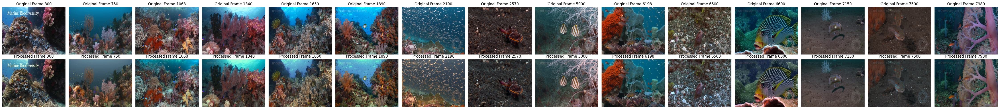

In [1]:
#Paper Preparation
import cv2
import numpy as np
import matplotlib.pyplot as plt

def GW_white_balance(img):
    img_LAB = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    avg_a = np.average(img_LAB[:, :, 1])
    avg_b = np.average(img_LAB[:, :, 2])
    img_LAB[:, :, 1] = img_LAB[:, :, 1] - ((avg_a - 128) * (img_LAB[:, :, 0] / 255.0) * 3.5)
    img_LAB[:, :, 2] = img_LAB[:, :, 2] - ((avg_b - 128) * (img_LAB[:, :, 0] / 255.0) * 3.5)
    balanced_image = cv2.cvtColor(img_LAB, cv2.COLOR_LAB2BGR)
    return balanced_image

# Load the video
video_path = 'test.mp4'
cap = cv2.VideoCapture(video_path)

# Frame numbers to display
frame_numbers = [300, 750 ,1068, 1340, 1650,1890, 2190, 2570, 5000, 6198, 6500, 6600, 7150, 7500, 7980]

# Update the number of columns to match the number of frames
fig, axes = plt.subplots(nrows=2, ncols=len(frame_numbers), figsize=(45, 5))

for i, frame_number in enumerate(frame_numbers):
    # Read the frame
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_number)
    ret, frame = cap.read()
    if not ret:
        break
    
    # Resize the frame
    resized_frame = cv2.resize(frame, (640, 480))
    
    # Apply white balance function
    processed_frame = GW_white_balance(resized_frame)

    # Display the original frame on the right side
    axes[0, i].imshow(cv2.cvtColor(resized_frame, cv2.COLOR_BGR2RGB))
    axes[0, i].axis('off')
    axes[0, i].set_title(f'Original Frame {frame_number}')

    # Display the processed frame on the left side
    axes[1, i].imshow(cv2.cvtColor(processed_frame, cv2.COLOR_BGR2RGB))
    axes[1, i].axis('off')
    axes[1, i].set_title(f'Processed Frame {frame_number}')

plt.tight_layout()
plt.savefig('video_Gray_frames_plot.png')
plt.show()

cap.release()


#### Applying CLAHE Algorithm
#### Histogram Equalization
Histogram equalization is a technique in image processing used to enhance the contrast of an image by redistributing the intensity values across the entire range. Here's a quick summary:

1. **Input Image:** The method starts with an input image that may have unevenly distributed pixel intensity values, leading to poor contrast.

2. **Histogram Calculation:** The histogram of the image is computed, which represents the frequency distribution of pixel intensities.

3. **Cumulative Distribution Function (CDF):** A cumulative distribution function is calculated from the histogram. The CDF provides the cumulative probability of pixel intensities.

4. **Histogram Equalization Transformation:** A transformation function is applied to map the original pixel intensities to new values based on the cumulative distribution function. This function aims to spread out the pixel intensities, making the histogram more uniform.

5. **Output Image:** The result is an equalized image with improved contrast, where a wider range of intensities is effectively utilized.

Histogram equalization is particularly useful in cases where an image has a limited dynamic range or is dominated by a specific intensity range. It can be applied to grayscale images or individual color channels in color images. The technique is widely used for image enhancement in various applications, such as computer vision, medical imaging, and digital photography.

In [ ]:
# RGB
import cv2

# Read the underwater video
cap = cv2.VideoCapture('test.mp4')

# Define the new size for the video
new_width, new_height = 640, 480

while cap.isOpened():
    ret, frame = cap.read()

    if not ret:
        break

    # Resize the frame
    resized_frame = cv2.resize(frame, (new_width, new_height))

    # Split the frame into individual channels
    b, g, r = cv2.split(resized_frame)

    # Apply histogram equalization to each channel
    equalized_b = cv2.equalizeHist(b)
    equalized_g = cv2.equalizeHist(g)
    equalized_r = cv2.equalizeHist(r)

    # Merge the equalized channels back into an RGB frame
    equalized_rgb_frame = cv2.merge([equalized_b, equalized_g, equalized_r])

    # Display the original and equalized RGB frames
    cv2.imshow('Original RGB Frame', resized_frame)
    cv2.imshow('Equalized RGB Frame', equalized_rgb_frame)

    # Break the loop when 'q' key is pressed
    if cv2.waitKey(30) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

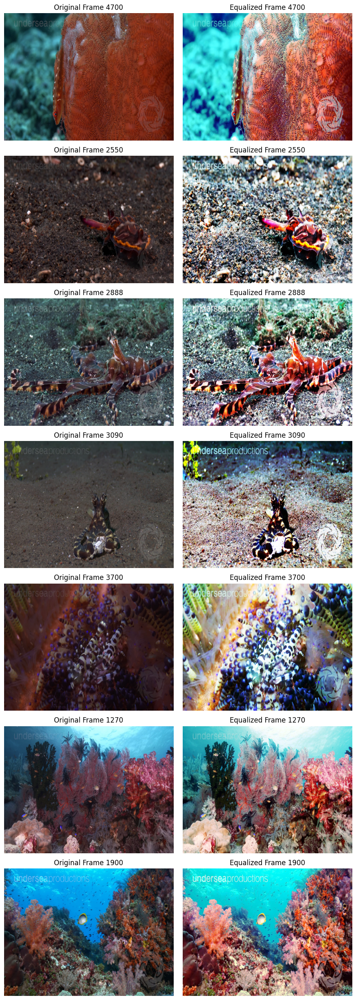

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Read the underwater video
cap = cv2.VideoCapture('test.mp4')

# Define the new size for the video
new_width, new_height = 640, 480

# Initialize lists to store original and equalized frames
original_frames = []
equalized_frames = []

# Specify the frame indices to showcase
selected_frames = [4700,2550,2888,3090,3700,1270,1900]

for frame_index in selected_frames:
    # Set the video capture to the desired frame
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_index - 1)

    # Read the frame
    ret, frame = cap.read()

    if not ret:
        break

    # Resize the frame
    resized_frame = cv2.resize(frame, (new_width, new_height))

    # Split the frame into individual channels
    b, g, r = cv2.split(resized_frame)

    # Apply histogram equalization to each channel
    equalized_b = cv2.equalizeHist(b)
    equalized_g = cv2.equalizeHist(g)
    equalized_r = cv2.equalizeHist(r)

    # Merge the equalized channels back into an RGB frame
    equalized_rgb_frame = cv2.merge([equalized_b, equalized_g, equalized_r])

    # Append frames to the lists
    original_frames.append(resized_frame)
    equalized_frames.append(equalized_rgb_frame)

cap.release()

# Plotting original and equalized RGB frames
fig, axes = plt.subplots(len(selected_frames), 2, figsize=(9, 3.5 * len(selected_frames)))

for i, (original, equalized) in enumerate(zip(original_frames, equalized_frames)):
    axes[i, 0].imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title(f'Original Frame {selected_frames[i]}')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(cv2.cvtColor(equalized, cv2.COLOR_BGR2RGB))
    axes[i, 1].set_title(f'Equalized Frame {selected_frames[i]}')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.savefig('Histogram_Equalization_Results.png')
plt.show()

#### Applying CLAHE Algorithm
**CLAHE Algorithm Summary:**

Contrast Limited Adaptive Histogram Equalization (CLAHE) is an image enhancement technique that improves contrast by adaptively equalizing the histogram of local regions within an image. It divides the image into tiles, performs histogram equalization independently on each tile, and limits the contrast enhancement to avoid amplifying noise excessively. This adaptive and localized approach enhances the visibility of details in images, making it particularly useful in situations with varying illumination and complex image content. The method finds applications in fields such as medical imaging, computer vision, and satellite imagery.

In [ ]:
import cv2

# Read the underwater video
cap = cv2.VideoCapture('test.mp4')

# Define the new size for the video
new_width, new_height = 640, 480

# Define the CLAHE parameters
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

while cap.isOpened():
    ret, frame = cap.read()

    if not ret:
        break

    # Resize the frame
    resized_frame = cv2.resize(frame, (new_width, new_height))

    # Convert the frame to LAB color space
    lab_frame = cv2.cvtColor(resized_frame, cv2.COLOR_BGR2LAB)

    # Apply CLAHE to the L channel (lightness) of LAB
    lab_frame[:, :, 0] = clahe.apply(lab_frame[:, :, 0])

    # Convert the frame back to BGR
    clahe_frame = cv2.cvtColor(lab_frame, cv2.COLOR_LAB2BGR)

    # Display the original and CLAHE-enhanced frames
    cv2.imshow('Original Frame', resized_frame)
    cv2.imshow('CLAHE Frame', clahe_frame)

    # Break the loop when 'q' key is pressed
    if cv2.waitKey(30) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

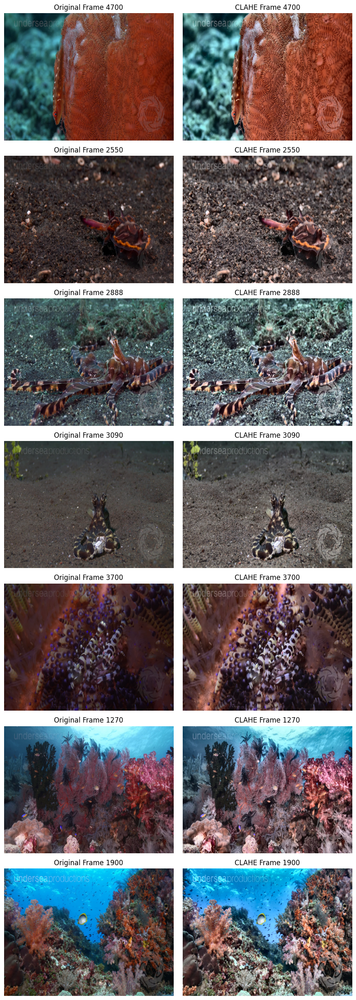

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Read the underwater video
cap = cv2.VideoCapture('test.mp4')

# Define the new size for the video
new_width, new_height = 640, 480

# Define the CLAHE parameters
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Specify the frame indices to showcase
selected_frames = [4700,2550,2888,3090,3700,1270,1900]

# Initialize lists to store original and CLAHE frames
original_frames = []
clahe_frames = []

for frame_index in selected_frames:
    # Set the video capture to the desired frame
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_index - 1)

    # Read the frame
    ret, frame = cap.read()

    if not ret:
        break

    # Resize the frame
    resized_frame = cv2.resize(frame, (new_width, new_height))

    # Convert the frame to LAB color space
    lab_frame = cv2.cvtColor(resized_frame, cv2.COLOR_BGR2LAB)

    # Apply CLAHE to the L channel (lightness) of LAB
    lab_frame[:, :, 0] = clahe.apply(lab_frame[:, :, 0])

    # Convert the frame back to BGR
    clahe_frame = cv2.cvtColor(lab_frame, cv2.COLOR_LAB2BGR)

    # Append frames to the lists
    original_frames.append(resized_frame)
    clahe_frames.append(clahe_frame)

cap.release()

# Plotting original and CLAHE frames
fig, axes = plt.subplots(len(selected_frames), 2, figsize=(9, 3.5 * len(selected_frames)))

for i, (original, clahe) in enumerate(zip(original_frames, clahe_frames)):
    axes[i, 0].imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title(f'Original Frame {selected_frames[i]}')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(cv2.cvtColor(clahe, cv2.COLOR_BGR2RGB))
    axes[i, 1].set_title(f'CLAHE Frame {selected_frames[i]}')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.savefig('CLAHE_Results.png')
plt.show()

#### Comparison 
**Comparison between CLAHE and Histogram Equalization(HE):**

1. **Adaptiveness:**
   - **Histogram Equalization (HE):** Applies a global transformation to the entire image, redistributing pixel intensities based on the overall histogram.
   - **CLAHE:** Adapts the equalization process to local regions (tiles) within the image, enhancing contrast independently in different parts of the image.

2. **Local Enhancement:**
   - **HE:** Treats the entire image as a single entity, potentially leading to overamplification of noise in areas with low contrast.
   - **CLAHE:** Focuses on small, localized regions, allowing for more targeted enhancement and minimizing noise amplification.

3. **Contrast Limiting:**
   - **HE:** Does not inherently limit the extent of contrast enhancement, which can result in artifacts and noise amplification.
   - **CLAHE:** Introduces a clip limit to prevent excessive contrast enhancement, redistributing pixel intensities to neighboring bins if the limit is exceeded.

4. **Applicability:**
   - **HE:** Generally suitable for images with relatively uniform lighting conditions.
   - **CLAHE:** Particularly effective in images with varying illumination, shadows, or diverse content, providing adaptive enhancement.

5. **Artifact Handling:**
   - **HE:** May introduce artifacts, especially when applied to images with a wide range of intensities.
   - **CLAHE:** Offers improved artifact handling by considering local contexts, making it suitable for a broader range of images.

6. **Use Cases:**
   - **HE:** Commonly used in applications where a global enhancement is sufficient and noise is not a critical concern.
   - **CLAHE:** Preferred for scenarios requiring localized contrast improvement, such as medical imaging, satellite imagery, and computer vision applications.

7. **Parameter Sensitivity:**
   - **HE:** Less parameter-sensitive, as it operates on the entire image with a single set of parameters.
   - **CLAHE:** Requires careful tuning of parameters such as clip limit, grid size, and tile size to achieve optimal results based on the characteristics of the image.

In summary, while both HE and CLAHE aim to enhance contrast, CLAHE's adaptiveness and local focus make it more effective in handling diverse image content, especially in situations with varying illumination and complex details. It provides a balance between contrast improvement and noise control, offering advantages over traditional global histogram equalization.